In [131]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns

In [132]:
# loading the data from csv file to a Pandas DataFrame
parkinsons_data = pd.read_csv('/content/Parkinsson disease.csv')

In [133]:
# printing the first 5 rows of the dataframe
parkinsons_data.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [134]:
# number of rows and columns in the dataframe
parkinsons_data.shape

(195, 24)

In [135]:
# getting more information about the dataset
parkinsons_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

In [136]:
# checking for missing values in each column
parkinsons_data.isnull().sum()

name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64

In [137]:
# getting some statistical measures about the data
parkinsons_data.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [138]:
parkinsons_data.drop(columns=['name'], axis=1, inplace=True)

In [139]:
parkinsons_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MDVP:Fo(Hz)       195 non-null    float64
 1   MDVP:Fhi(Hz)      195 non-null    float64
 2   MDVP:Flo(Hz)      195 non-null    float64
 3   MDVP:Jitter(%)    195 non-null    float64
 4   MDVP:Jitter(Abs)  195 non-null    float64
 5   MDVP:RAP          195 non-null    float64
 6   MDVP:PPQ          195 non-null    float64
 7   Jitter:DDP        195 non-null    float64
 8   MDVP:Shimmer      195 non-null    float64
 9   MDVP:Shimmer(dB)  195 non-null    float64
 10  Shimmer:APQ3      195 non-null    float64
 11  Shimmer:APQ5      195 non-null    float64
 12  MDVP:APQ          195 non-null    float64
 13  Shimmer:DDA       195 non-null    float64
 14  NHR               195 non-null    float64
 15  HNR               195 non-null    float64
 16  status            195 non-null    int64  
 1

                  MDVP:Fo(Hz)  MDVP:Fhi(Hz)  MDVP:Flo(Hz)  MDVP:Jitter(%)  \
MDVP:Fo(Hz)          1.000000      0.400985      0.596546       -0.118003   
MDVP:Fhi(Hz)         0.400985      1.000000      0.084951        0.102086   
MDVP:Flo(Hz)         0.596546      0.084951      1.000000       -0.139919   
MDVP:Jitter(%)      -0.118003      0.102086     -0.139919        1.000000   
MDVP:Jitter(Abs)    -0.382027     -0.029198     -0.277815        0.935714   
MDVP:RAP            -0.076194      0.097177     -0.100519        0.990276   
MDVP:PPQ            -0.112165      0.091126     -0.095828        0.974256   
Jitter:DDP          -0.076213      0.097150     -0.100488        0.990276   
MDVP:Shimmer        -0.098374      0.002281     -0.144543        0.769063   
MDVP:Shimmer(dB)    -0.073742      0.043465     -0.119089        0.804289   
Shimmer:APQ3        -0.094717     -0.003743     -0.150747        0.746625   
Shimmer:APQ5        -0.070682     -0.009997     -0.101095        0.725561   

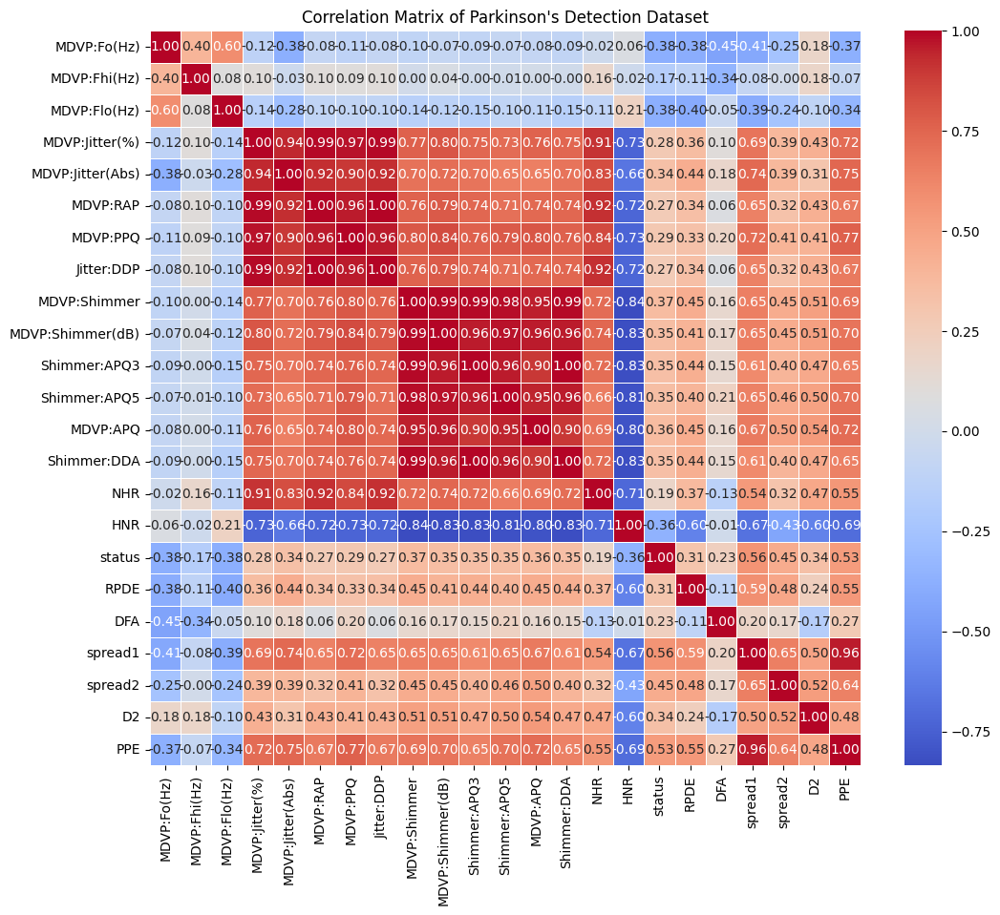

In [140]:
# Calculate the correlation matrix
corr_matrix = parkinsons_data.corr()

# Print the correlation matrix
print(corr_matrix)

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)

# Title and show the plot
plt.title('Correlation Matrix of Parkinson\'s Detection Dataset')
plt.show()

In [141]:
# Calculate the correlation matrix
corr_matrix = parkinsons_data.corr().abs()  # Use absolute value for easier comparison

# Identify highly correlated pairs
high_corr_pairs = [(i, j) for i in corr_matrix.columns for j in corr_matrix.columns
                   if i != j and corr_matrix.loc[i, j] > 0.8]


In [142]:
# Print the highly correlated pairs
print("Highly correlated pairs (|r| > 0.8):")
for pair in high_corr_pairs:
    print(f"{pair[0]} and {pair[1]}: {corr_matrix.loc[pair[0], pair[1]]}")

Highly correlated pairs (|r| > 0.8):
MDVP:Jitter(%) and MDVP:Jitter(Abs): 0.9357139812023576
MDVP:Jitter(%) and MDVP:RAP: 0.9902755852458324
MDVP:Jitter(%) and MDVP:PPQ: 0.9742563864635724
MDVP:Jitter(%) and Jitter:DDP: 0.9902762153275699
MDVP:Jitter(%) and MDVP:Shimmer(dB): 0.8042892804109836
MDVP:Jitter(%) and NHR: 0.9069586005733022
MDVP:Jitter(Abs) and MDVP:Jitter(%): 0.9357139812023576
MDVP:Jitter(Abs) and MDVP:RAP: 0.9229109688984641
MDVP:Jitter(Abs) and MDVP:PPQ: 0.8977779044154587
MDVP:Jitter(Abs) and Jitter:DDP: 0.9229130329829802
MDVP:Jitter(Abs) and NHR: 0.834972175372741
MDVP:RAP and MDVP:Jitter(%): 0.9902755852458324
MDVP:RAP and MDVP:Jitter(Abs): 0.9229109688984641
MDVP:RAP and MDVP:PPQ: 0.9573168930480012
MDVP:RAP and Jitter:DDP: 0.9999996001041346
MDVP:RAP and NHR: 0.9195207096034025
MDVP:PPQ and MDVP:Jitter(%): 0.9742563864635724
MDVP:PPQ and MDVP:Jitter(Abs): 0.8977779044154587
MDVP:PPQ and MDVP:RAP: 0.9573168930480012
MDVP:PPQ and Jitter:DDP: 0.9573191582070275
MDVP:

In [143]:
# Decide which features to remove
features_to_remove = set(j for i, j in high_corr_pairs)

In [144]:
# Remove the features
parkinsons_data_reduced = parkinsons_data.drop(columns=features_to_remove)

In [145]:
# Print the columns before and after removing features
print("Columns before removing features:", parkinsons_data.columns)
print("Columns after removing features:", parkinsons_data_reduced.columns)

Columns before removing features: Index(['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'],
      dtype='object')
Columns after removing features: Index(['MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'status', 'RPDE', 'DFA',
       'spread2', 'D2'],
      dtype='object')


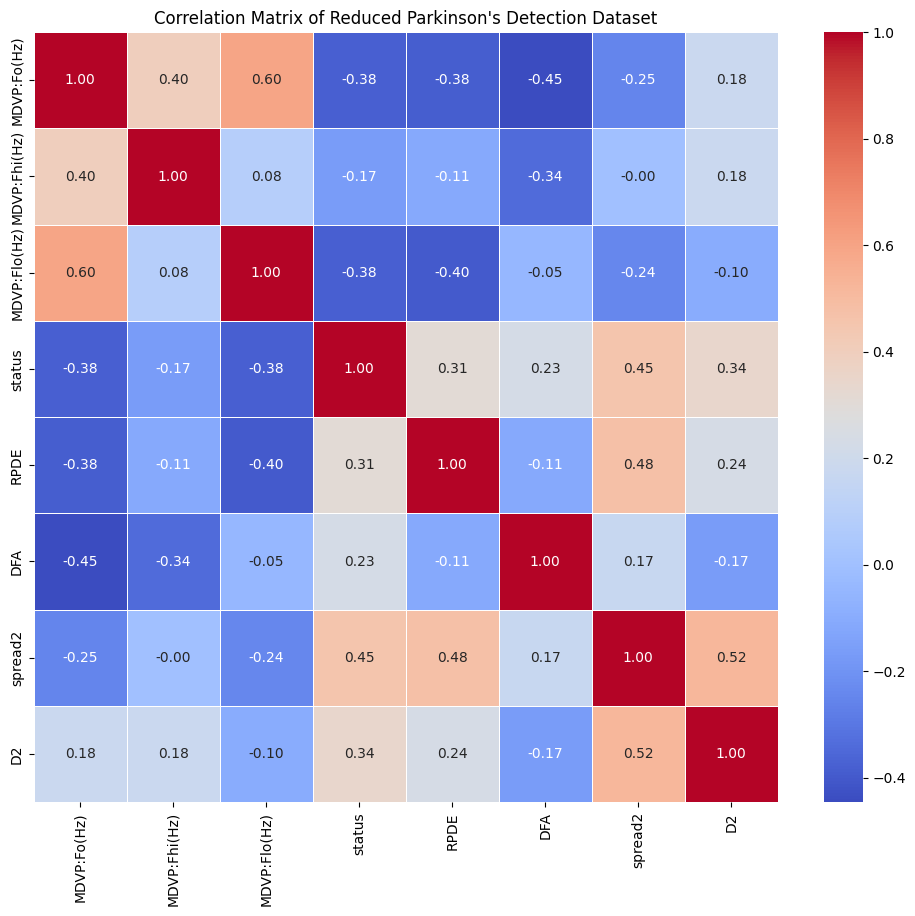

In [146]:
# Calculate the new correlation matrix for reduced dataset
corr_matrix_reduced = parkinsons_data_reduced.corr()

# Plot the new correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix_reduced, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Reduced Parkinson\'s Detection Dataset')
plt.show()

In [147]:
parkinsons_data_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   MDVP:Fo(Hz)   195 non-null    float64
 1   MDVP:Fhi(Hz)  195 non-null    float64
 2   MDVP:Flo(Hz)  195 non-null    float64
 3   status        195 non-null    int64  
 4   RPDE          195 non-null    float64
 5   DFA           195 non-null    float64
 6   spread2       195 non-null    float64
 7   D2            195 non-null    float64
dtypes: float64(7), int64(1)
memory usage: 12.3 KB


In [148]:
# distribution of target Variable
y=parkinsons_data_reduced['status'].values

# Calculate the number of samples in each class
count_class_0 = np.sum(y == 0)
count_class_1 = np.sum(y == 1)

# Calculate the total number of samples
total_samples = len(y)

# Calculate the percentage of each class
percentage_class_0 = (count_class_0 / total_samples) * 100
percentage_class_1 = (count_class_1 / total_samples) * 100

# Print the results
print(f"Percentage of Healthy individuals (Class 0): {percentage_class_0:.2f}%")
print(f"Percentage of Individuals with Parkinson's disease (Class 1): {percentage_class_1:.2f}%")

Percentage of Healthy individuals (Class 0): 24.62%
Percentage of Individuals with Parkinson's disease (Class 1): 75.38%


In [149]:
X = parkinsons_data_reduced.drop(columns=['status'], axis=1)
Y = parkinsons_data_reduced['status']

In [150]:
# Splitting the data using stratified sampling
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2, stratify=Y)

In [151]:
print(X_test.shape)

(39, 7)


In [152]:
# Handling class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train_smote, Y_train_smote = smote.fit_resample(X_train, Y_train)

In [153]:
# Calculate the number of samples in each class after addressing class imbalance
count_class_0 = np.sum(Y_train_smote == 0)
count_class_1 = np.sum(Y_train_smote == 1)

# Calculate the total number of samples
total_samples = len(Y_train_smote)

# Calculate the percentage of each class
percentage_class_0 = (count_class_0 / total_samples) * 100
percentage_class_1 = (count_class_1 / total_samples) * 100

# Print the results
print(f"Percentage of Healthy individuals (Class 0): {percentage_class_0:.2f}%")
print(f"Percentage of Individuals with Parkinson's disease (Class 1): {percentage_class_1:.2f}%")

Percentage of Healthy individuals (Class 0): 50.00%
Percentage of Individuals with Parkinson's disease (Class 1): 50.00%


In [154]:
# Standardizing features
scaler = StandardScaler()
X_train_smote = scaler.fit_transform(X_train_smote)
X_test = scaler.transform(X_test)

In [155]:
# Models
models = {
    "Logistic Regression": LogisticRegression(),
    "SVM": SVC(kernel='linear'),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "XGBoost": XGBClassifier(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "AdaBoost": AdaBoostClassifier()
}

In [156]:
# Metrics dictionaries
metrics = {
    "Model": [],
    "Accuracy": [],
    "Precision": [],
    "Recall": [],
    "F1 Score": []
}

In [157]:
# Training and evaluating models
for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_train_smote, Y_train_smote)

    Y_pred = model.predict(X_test)

    metrics["Model"].append(name)
    metrics["Accuracy"].append(accuracy_score(Y_test, Y_pred))
    metrics["Precision"].append(precision_score(Y_test, Y_pred))
    metrics["Recall"].append(recall_score(Y_test, Y_pred))
    metrics["F1 Score"].append(f1_score(Y_test, Y_pred))

    print(f"{name} - Accuracy: {metrics['Accuracy'][-1]:.4f}, Precision: {metrics['Precision'][-1]:.4f}, Recall: {metrics['Recall'][-1]:.4f}, F1 Score: {metrics['F1 Score'][-1]:.4f}")

Training Logistic Regression...
Logistic Regression - Accuracy: 0.6923, Precision: 0.8696, Recall: 0.6897, F1 Score: 0.7692
Training SVM...
SVM - Accuracy: 0.7436, Precision: 0.9130, Recall: 0.7241, F1 Score: 0.8077
Training Random Forest...
Random Forest - Accuracy: 0.9487, Precision: 0.9655, Recall: 0.9655, F1 Score: 0.9655
Training Gradient Boosting...
Gradient Boosting - Accuracy: 0.9231, Precision: 0.9643, Recall: 0.9310, F1 Score: 0.9474
Training XGBoost...
XGBoost - Accuracy: 0.9231, Precision: 0.9643, Recall: 0.9310, F1 Score: 0.9474
Training K-Nearest Neighbors...
K-Nearest Neighbors - Accuracy: 0.8462, Precision: 0.9600, Recall: 0.8276, F1 Score: 0.8889
Training Naive Bayes...
Naive Bayes - Accuracy: 0.7692, Precision: 0.9167, Recall: 0.7586, F1 Score: 0.8302
Training Decision Tree...
Decision Tree - Accuracy: 0.8205, Precision: 0.9231, Recall: 0.8276, F1 Score: 0.8727
Training AdaBoost...
AdaBoost - Accuracy: 0.8974, Precision: 0.9032, Recall: 0.9655, F1 Score: 0.9333


Confusion Matrix for Logistic Regression:


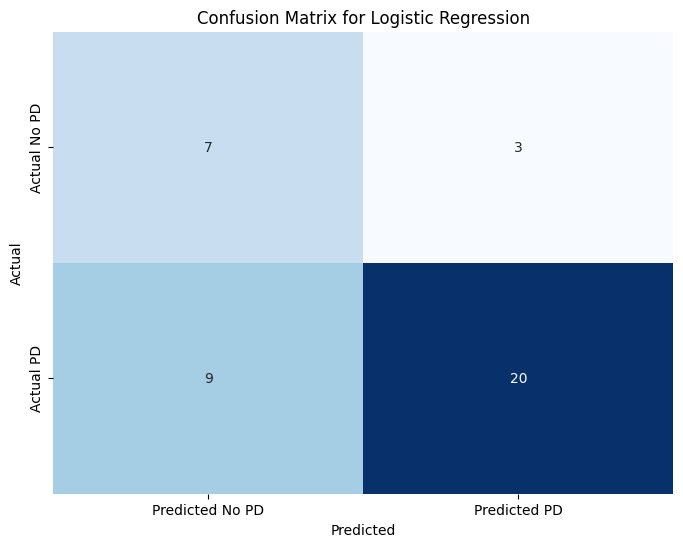

Confusion Matrix for SVM:


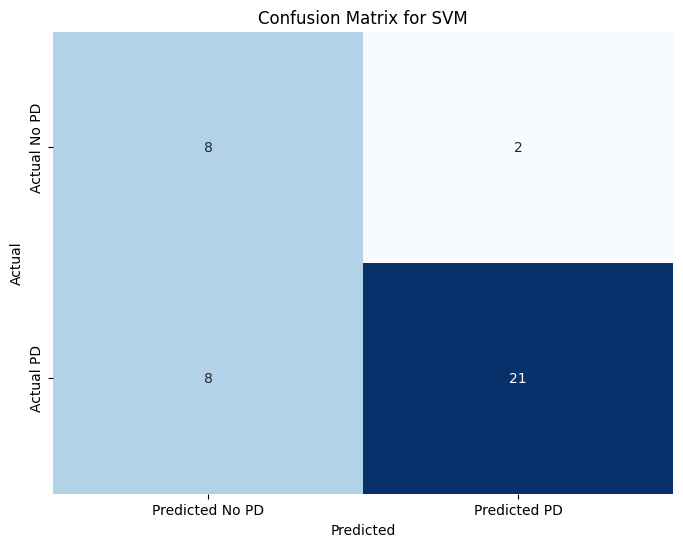

Confusion Matrix for Random Forest:


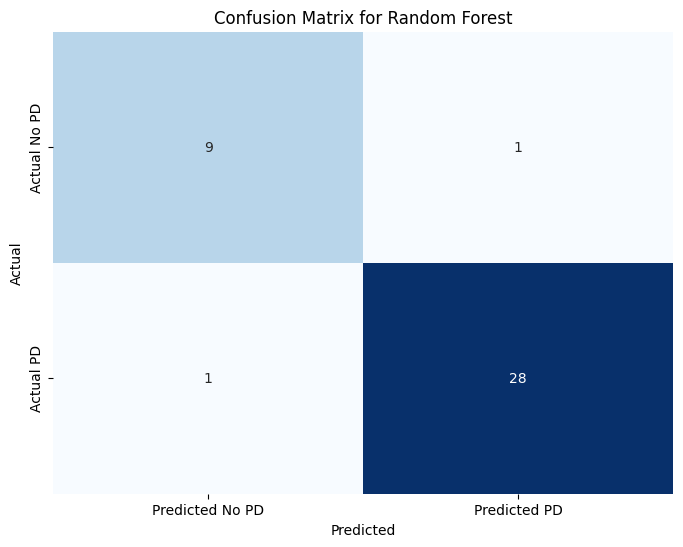

Confusion Matrix for Gradient Boosting:


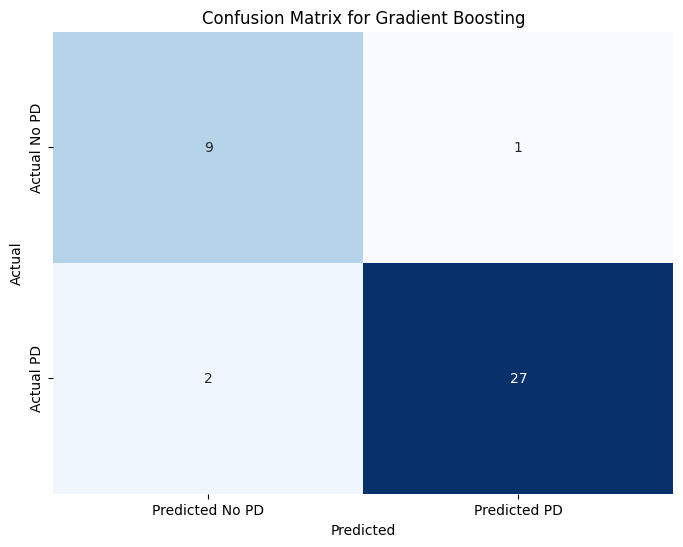

Confusion Matrix for XGBoost:


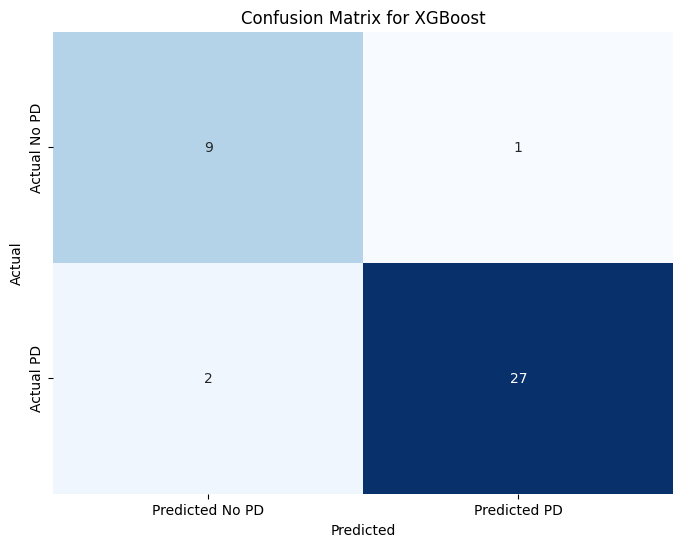

Confusion Matrix for K-Nearest Neighbors:


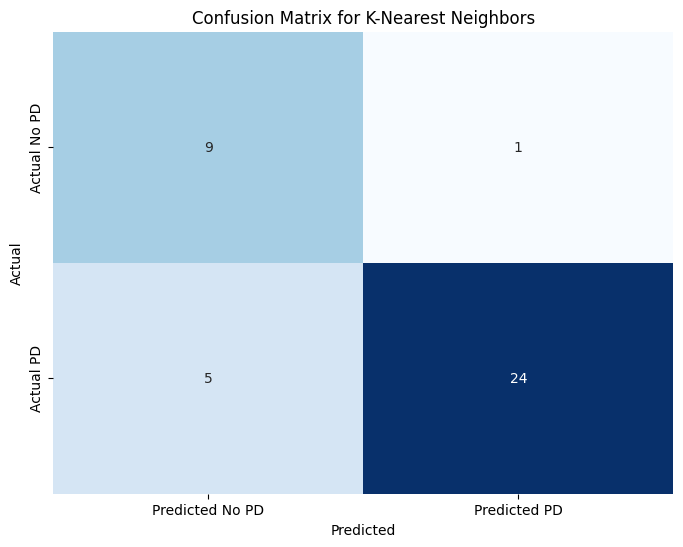

Confusion Matrix for Naive Bayes:


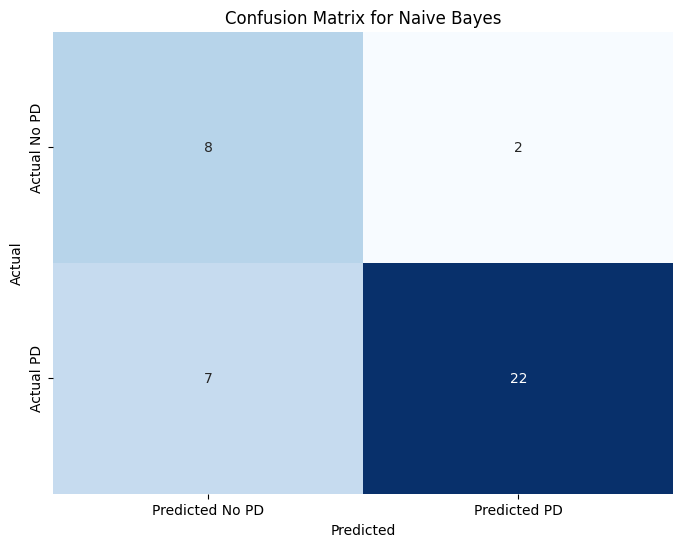

Confusion Matrix for Decision Tree:


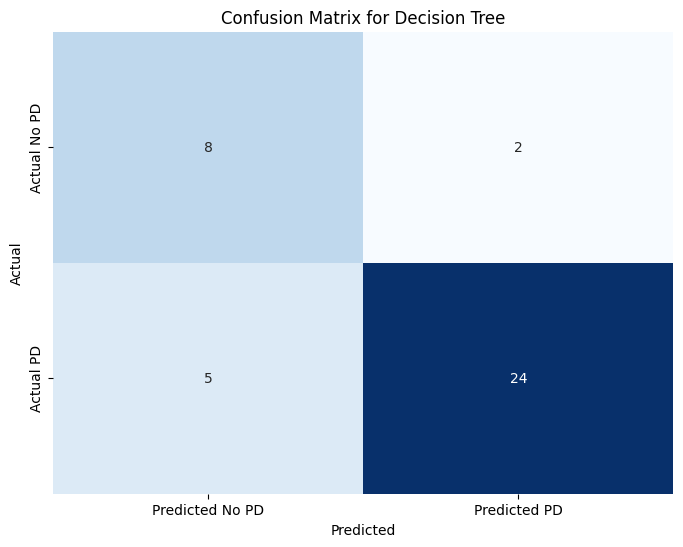

Confusion Matrix for AdaBoost:


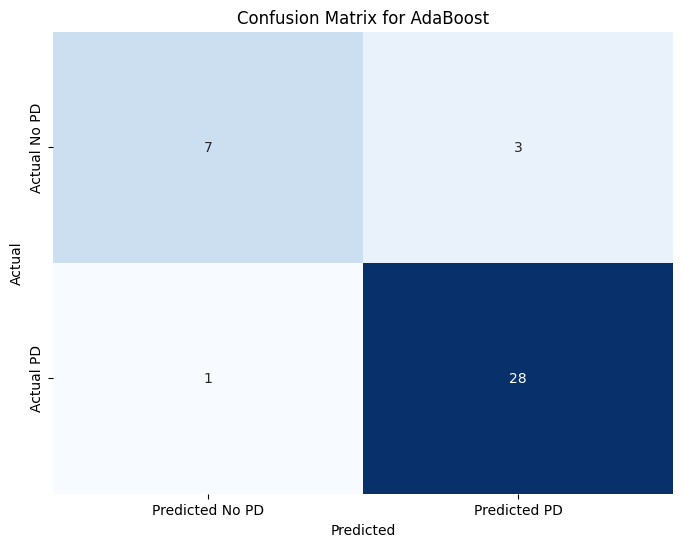

In [158]:
# Confusion matrix for each model
for name, model in models.items():
    print(f"Confusion Matrix for {name}:")
    cm = confusion_matrix(Y_test, model.predict(X_test))
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', cbar=False,
                xticklabels=['Predicted No PD', 'Predicted PD'],
                yticklabels=['Actual No PD', 'Actual PD'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {name}')
    plt.show()

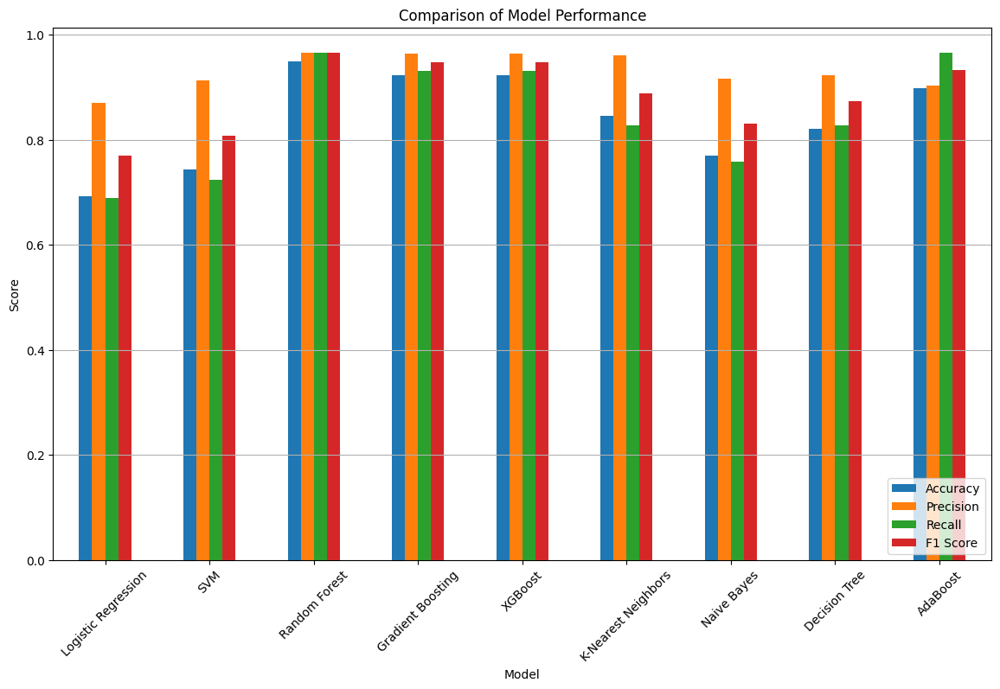

In [159]:
# Creating a DataFrame for metrics
metrics_df = pd.DataFrame(metrics)

# Plotting the performance comparison
metrics_df.set_index('Model', inplace=True)
metrics_df.plot(kind='bar', figsize=(14, 8))
plt.title('Comparison of Model Performance')
plt.xlabel('Model')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.legend(loc='lower right')
plt.grid(axis='y')
plt.show()

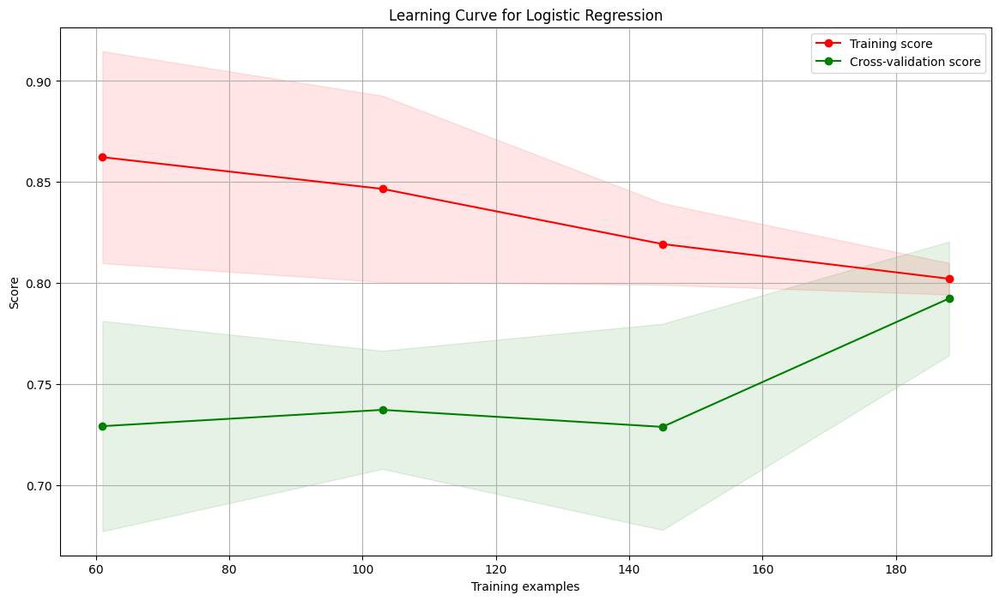

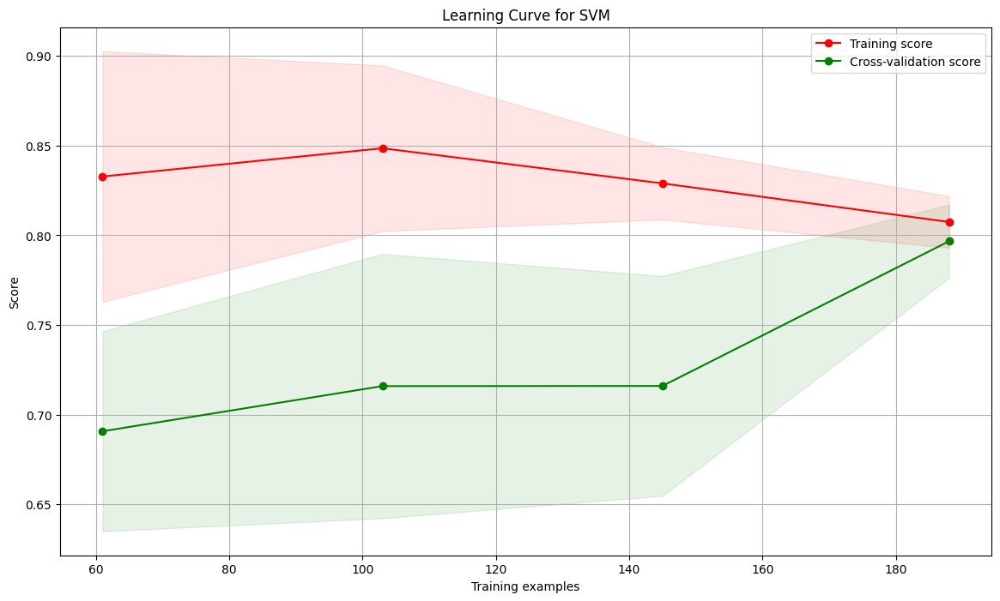

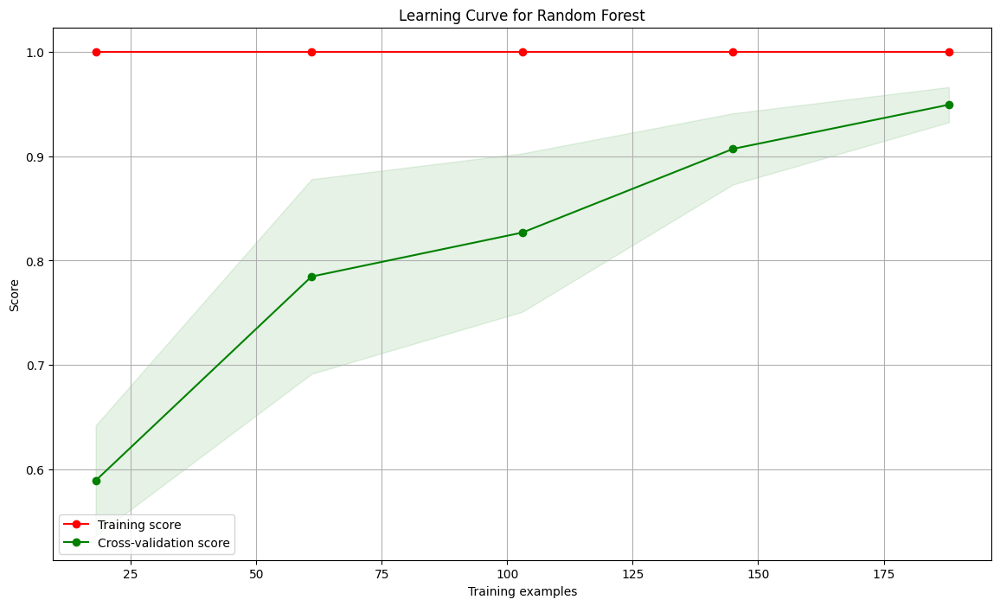

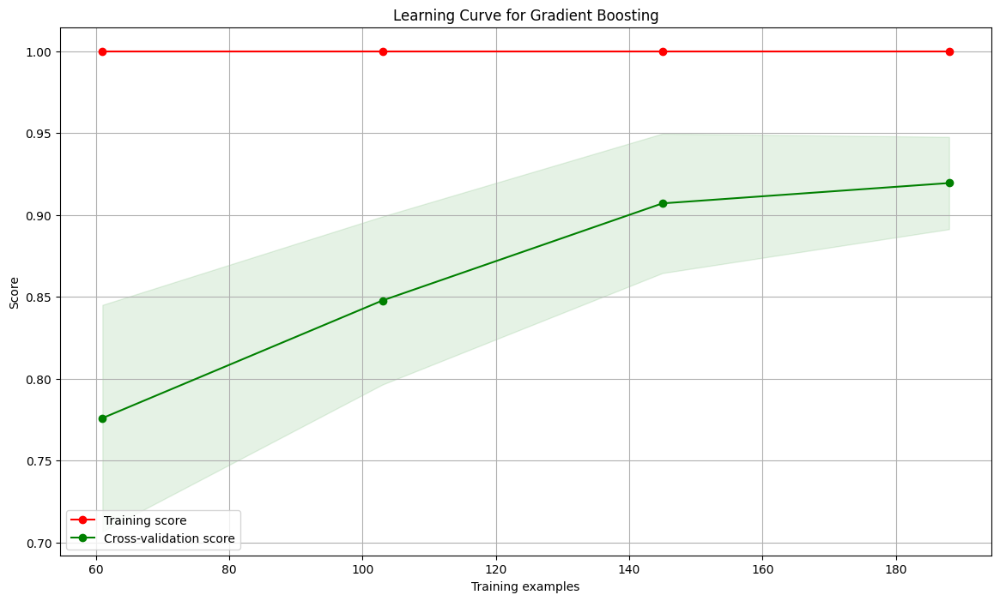

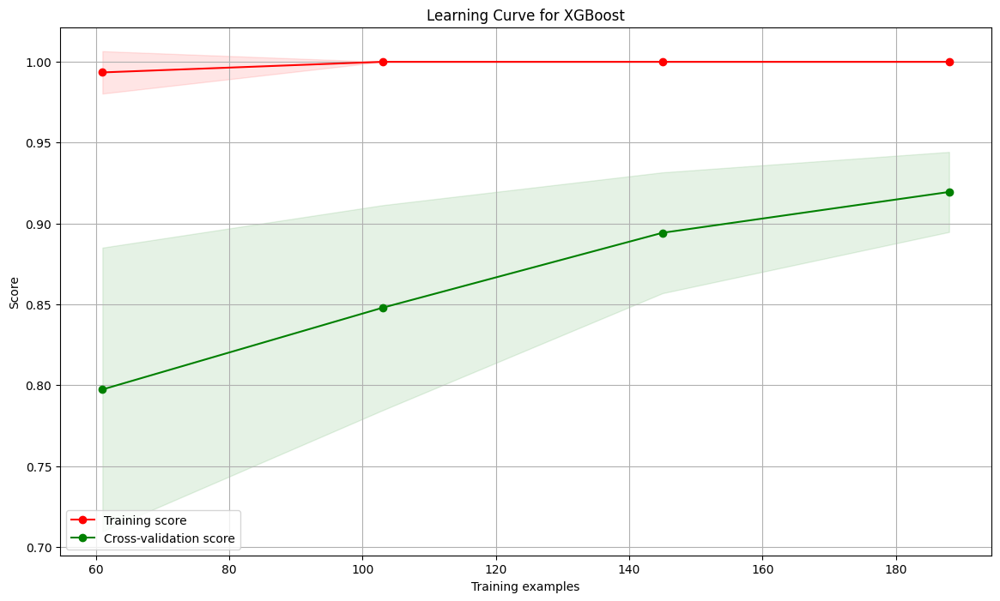

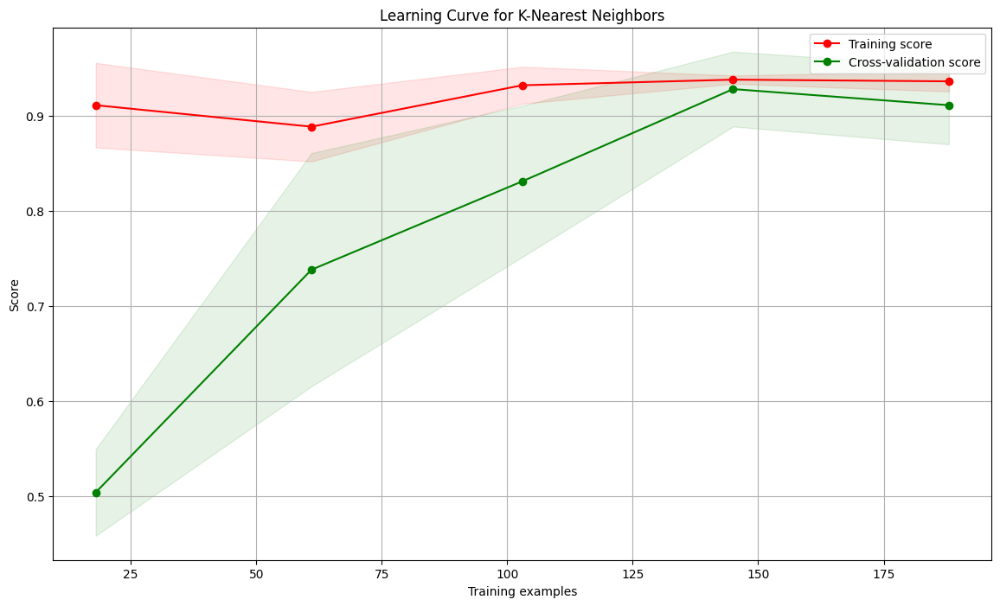

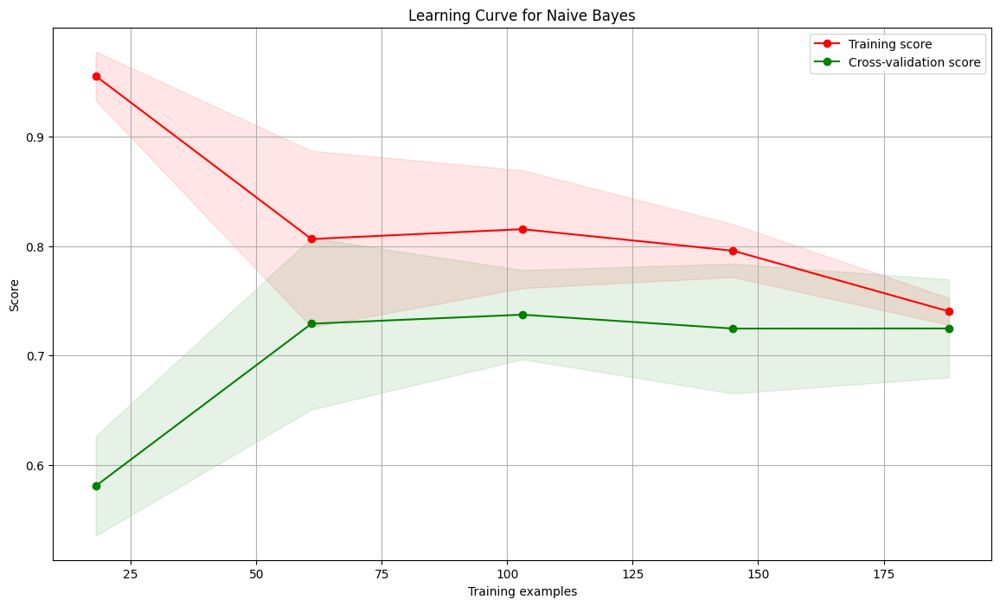

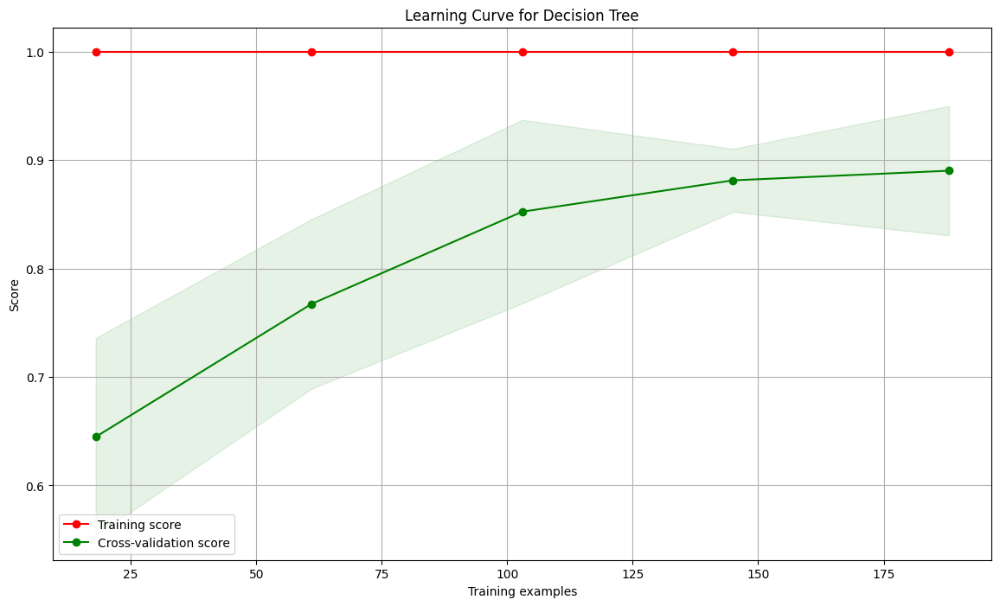

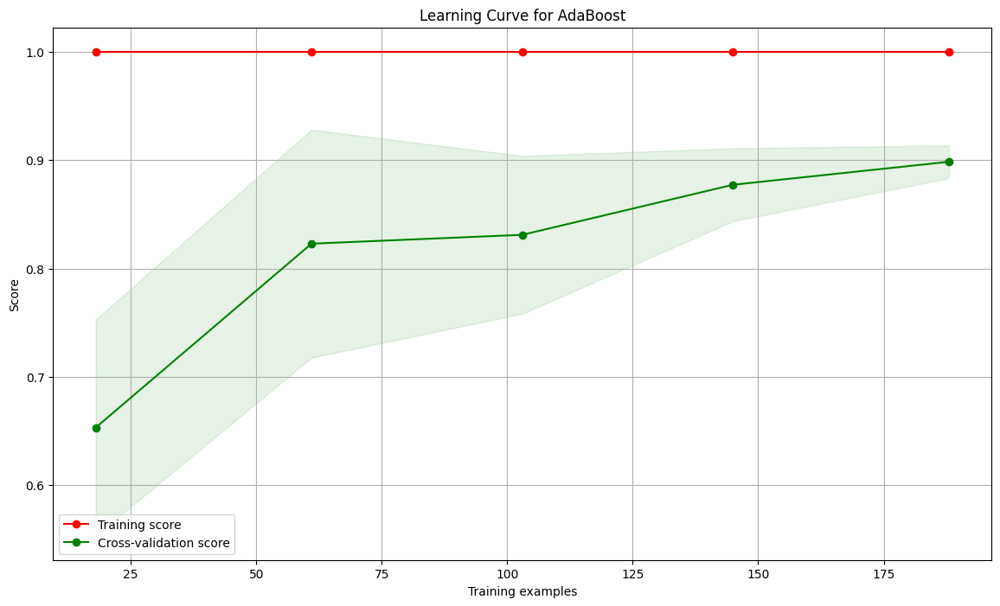

In [160]:
from sklearn.model_selection import train_test_split, learning_curve

# Plotting learning curves
def plot_learning_curve(estimator, title, X, y, cv=None, n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure(figsize=(14, 8))
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score")

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

# Plotting learning curves for each model
for name, model in models.items():
    plot_learning_curve(model, f'Learning Curve for {name}', X_train_smote, Y_train_smote, cv=5)
    plt.show()

In [161]:
# Sample prediction   -------------- DO NOT RUN!!!!!!!!!
#input_data = (197.07600,206.89600,192.05500,0.00289,0.00001,0.00166,0.00168,0.00498,0.01098,0.09700,0.00563,0.00680,0.00802,0.01689,0.00339,26.77500,0.422229,0.741367,-7.348300,0.177551,1.743867,0.085569)
#input_data_as_numpy_array = np.asarray(input_data).reshape(1,-1)
#std_data = scaler.transform(input_data_as_numpy_array)

#for name, model in models.items():
 #   prediction = model.predict(std_data)
  #  if prediction[0] == 0:
   ##else:
     #   print(f"{name}: The Person has Parkinson's")

In [162]:
# Sample prediction
input_data = (197.07600,206.89600,192.05500,0.422229,0.741367,0.177551, 1.743867)
input_data_as_numpy_array = np.asarray(input_data).reshape(1,-1)
std_data = scaler.transform(input_data_as_numpy_array)

for name, model in models.items():
    prediction = model.predict(std_data)
    if prediction[0] == 0:
        print(f"{name}: The Person does not have Parkinson's Disease")
    else:
        print(f"{name}: The Person has Parkinson's")

Logistic Regression: The Person does not have Parkinson's Disease
SVM: The Person does not have Parkinson's Disease
Random Forest: The Person does not have Parkinson's Disease
Gradient Boosting: The Person does not have Parkinson's Disease
XGBoost: The Person does not have Parkinson's Disease
K-Nearest Neighbors: The Person does not have Parkinson's Disease
Naive Bayes: The Person does not have Parkinson's Disease
Decision Tree: The Person does not have Parkinson's Disease
AdaBoost: The Person does not have Parkinson's Disease


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Feature Importance Analysis for Logistic Regression:


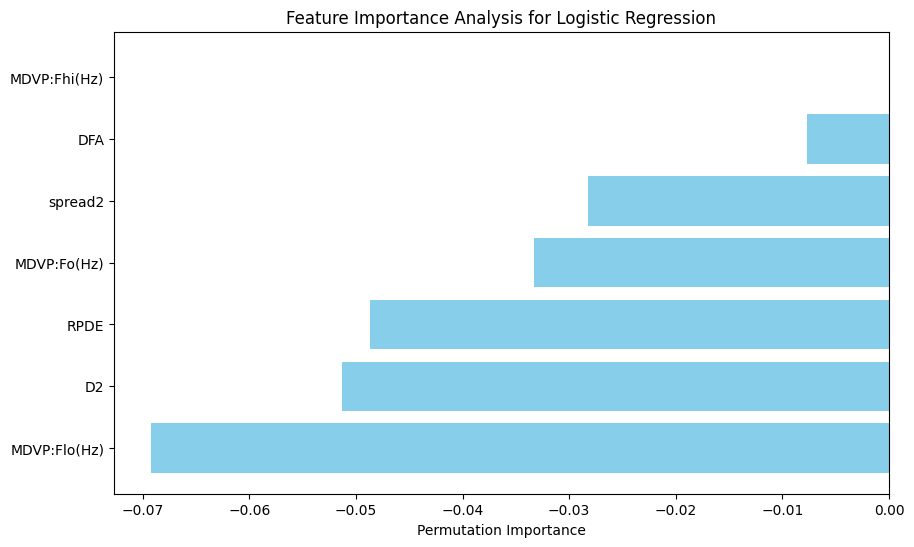

Feature Importance Analysis for SVM:


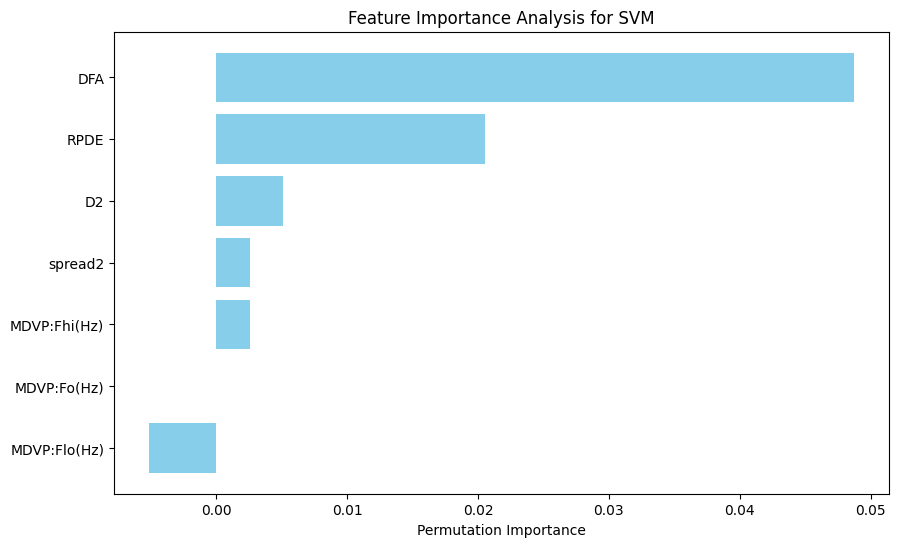

Feature Importance Analysis for Random Forest:


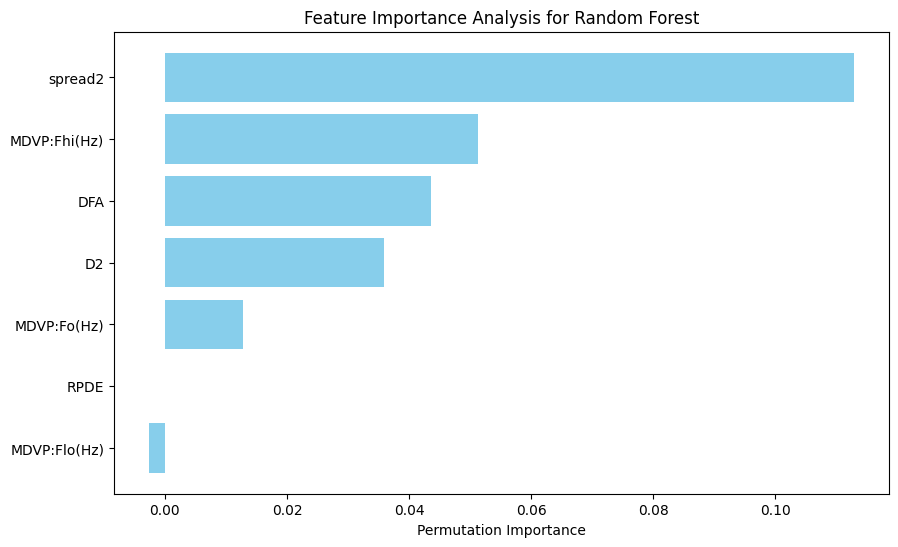

Feature Importance Analysis for Gradient Boosting:


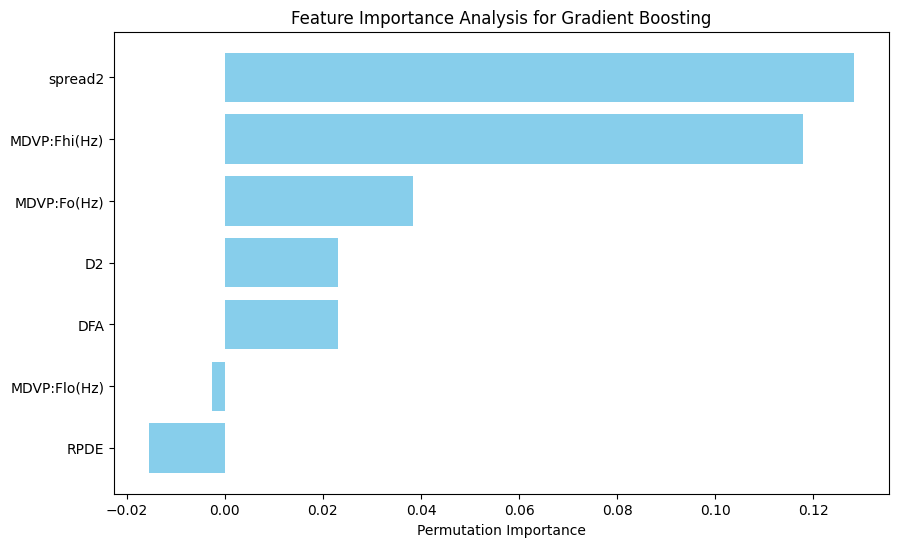

Feature Importance Analysis for XGBoost:


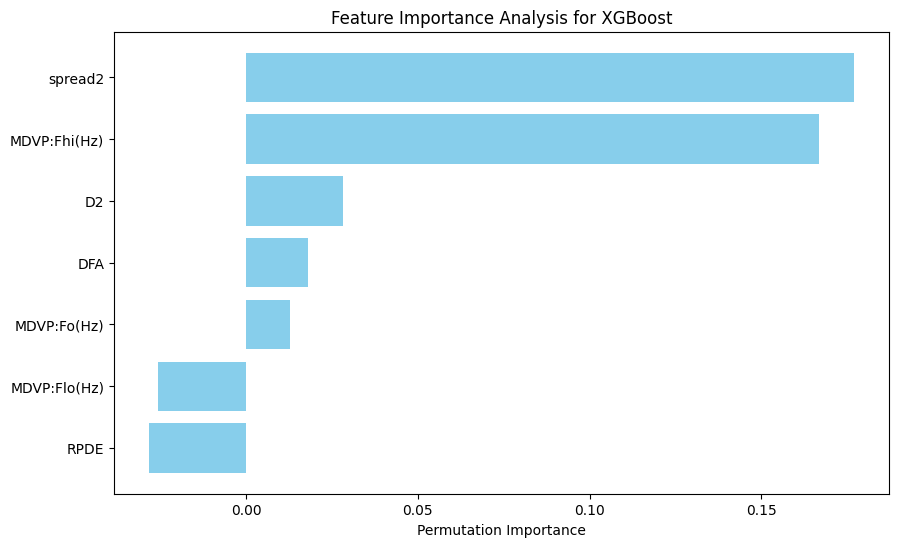

Feature Importance Analysis for K-Nearest Neighbors:


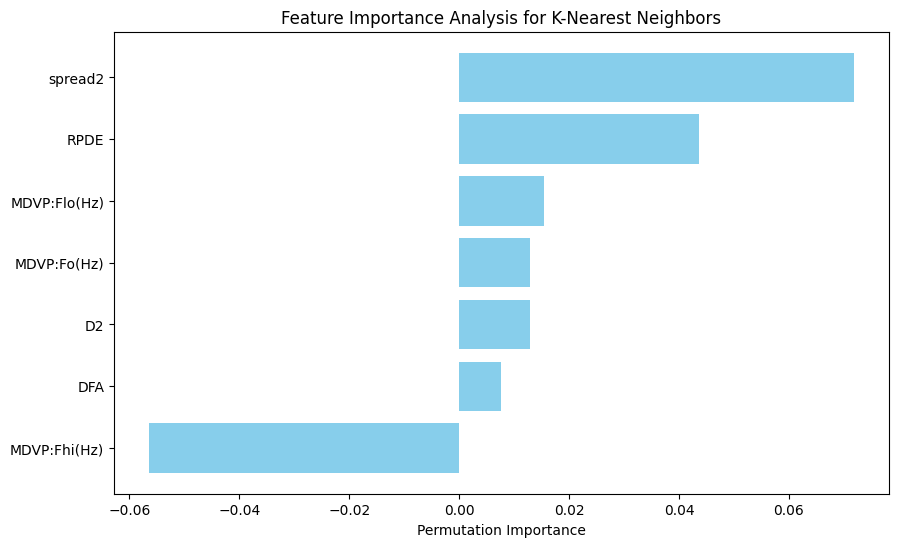

Feature Importance Analysis for Naive Bayes:


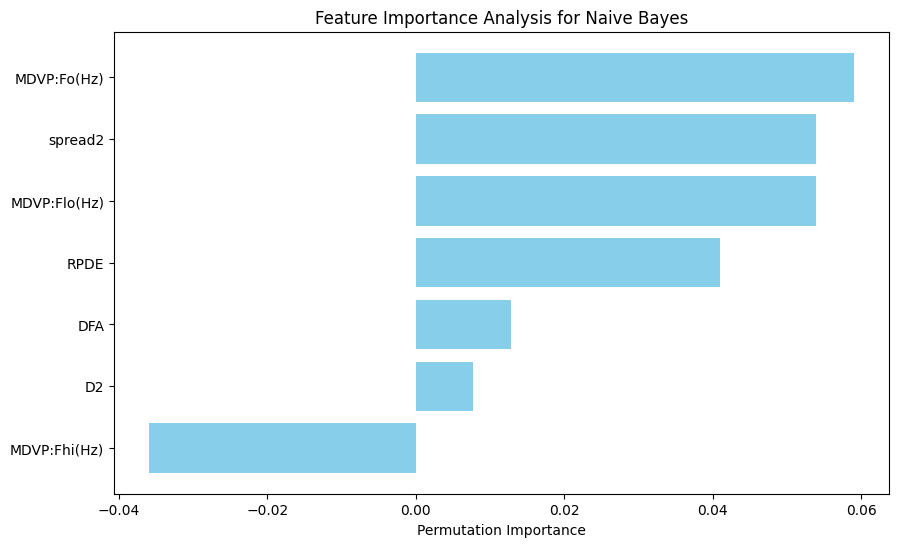

Feature Importance Analysis for Decision Tree:


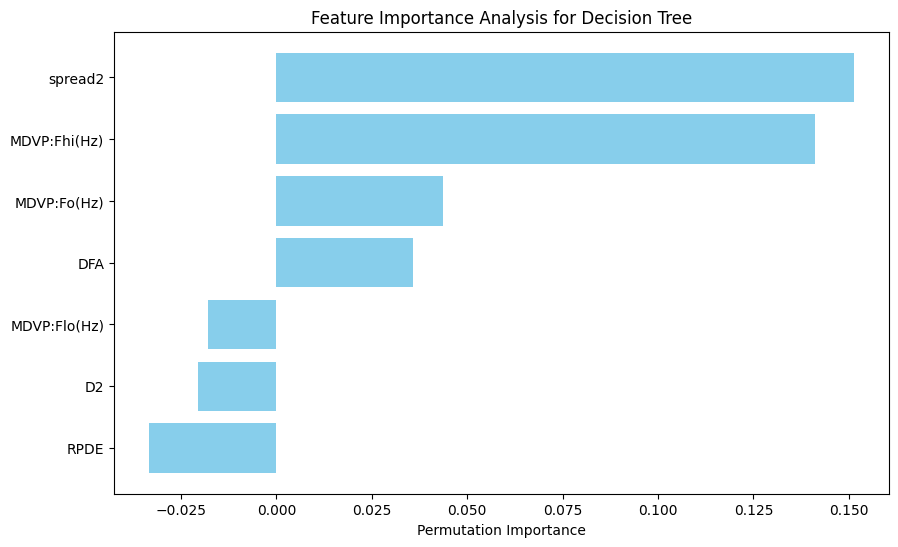

Feature Importance Analysis for AdaBoost:


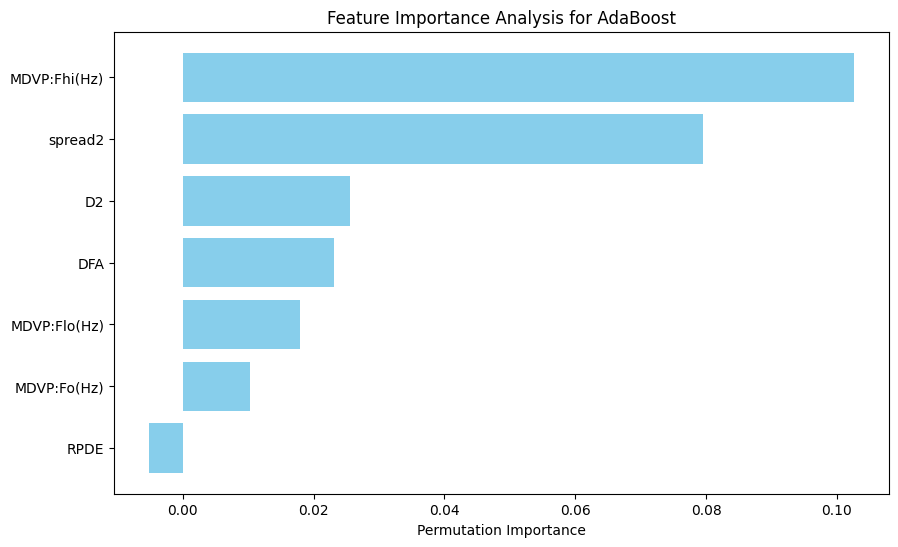

In [163]:
from sklearn.inspection import permutation_importance

# Feature Importance Analysis
for name, model in models.items():
    print(f"Feature Importance Analysis for {name}:")
    # Compute permutation importance
    result = permutation_importance(model, X_test, Y_test, n_repeats=10, random_state=42, n_jobs=-1)
    sorted_idx = result.importances_mean.argsort()
    # Plot feature importance
    plt.figure(figsize=(10, 6))
    plt.barh(X.columns[sorted_idx], result.importances_mean[sorted_idx], color='skyblue')
    plt.xlabel("Permutation Importance")
    plt.title(f"Feature Importance Analysis for {name}")
    plt.show()


In [164]:
for name, model in models.items():
    print(f"Feature Importance Analysis for {name}:")
    # Compute permutation importance
    result = permutation_importance(model, X_test, Y_test, n_repeats=10, random_state=42, n_jobs=-1)
    sorted_idx = result.importances_mean.argsort()

    # Convert X_test to a Pandas DataFrame
    X_test_df = pd.DataFrame(X_test, columns=X.columns)

    # Print the top 3 most important features
    print("Top 3 most important features:")
    for i in range(3):
        feature_name = X_test_df.columns[sorted_idx[-(i+1)]]
        importance = result.importances_mean[sorted_idx[-(i+1)]]
        print(f"{i+1}. {feature_name}: {importance:.3f}")

Feature Importance Analysis for Logistic Regression:
Top 3 most important features:
1. MDVP:Fhi(Hz): 0.000
2. DFA: -0.008
3. spread2: -0.028
Feature Importance Analysis for SVM:
Top 3 most important features:
1. DFA: 0.049
2. RPDE: 0.021
3. D2: 0.005
Feature Importance Analysis for Random Forest:
Top 3 most important features:
1. spread2: 0.113
2. MDVP:Fhi(Hz): 0.051
3. DFA: 0.044
Feature Importance Analysis for Gradient Boosting:
Top 3 most important features:
1. spread2: 0.128
2. MDVP:Fhi(Hz): 0.118
3. MDVP:Fo(Hz): 0.038
Feature Importance Analysis for XGBoost:
Top 3 most important features:
1. spread2: 0.177
2. MDVP:Fhi(Hz): 0.167
3. D2: 0.028
Feature Importance Analysis for K-Nearest Neighbors:
Top 3 most important features:
1. spread2: 0.072
2. RPDE: 0.044
3. MDVP:Flo(Hz): 0.015
Feature Importance Analysis for Naive Bayes:
Top 3 most important features:
1. MDVP:Fo(Hz): 0.059
2. spread2: 0.054
3. MDVP:Flo(Hz): 0.054
Feature Importance Analysis for Decision Tree:
Top 3 most importan

In [165]:
!pip install lime

In [166]:
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

In [167]:
# Define parameters for GridSearchCV
param_grid = {'n_neighbors': np.arange(3, 19),
               "weights": ["uniform", "distance"],
    "algorithm": ["auto", "ball_tree", "kd_tree", "brute"],
    "leaf_size": [30, 35, 40, 45, 50],
    "p": [1, 2],
    "metric": ["euclidean", "manhattan", "chebyshev", "minkowski"]
}

In [168]:
# Initialize KNN classifier
knn = KNeighborsClassifier()

# Initialize GridSearchCV
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')

In [169]:
# Fit GridSearchCV to training data
grid_search.fit(X_train_smote, Y_train_smote)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [30, 35, 40, 45, 50],
                         'metric': ['euclidean', 'manhattan', 'chebyshev',
                                    'minkowski'],
                         'n_neighbors': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18]),
                         'p': [1, 2], 'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [170]:
# Print the best parameters found
print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'manhattan', 'n_neighbors': 13, 'p': 1, 'weights': 'distance'}


In [171]:
# Train the KNN model with the best parameters
best_knn_model = KNeighborsClassifier(n_neighbors=grid_search.best_params_['n_neighbors'])
best_knn_model.fit(X_train_smote, Y_train_smote)

KNeighborsClassifier(n_neighbors=13)

In [172]:
X_train_smote_df = pd.DataFrame(X_train_smote)

In [173]:
# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_smote_df.values, feature_names=X_train_smote_df.columns, class_names=['Healthy', 'Parkinson'])

In [174]:
# Choose an instance from the test set to explain
instance_idx = 0  # You can choose any instance index from the test set
instance = X_test_df.iloc[instance_idx]

In [175]:
# Explain the instance's prediction using LIME
exp = explainer.explain_instance(instance.values, best_knn_model.predict_proba)

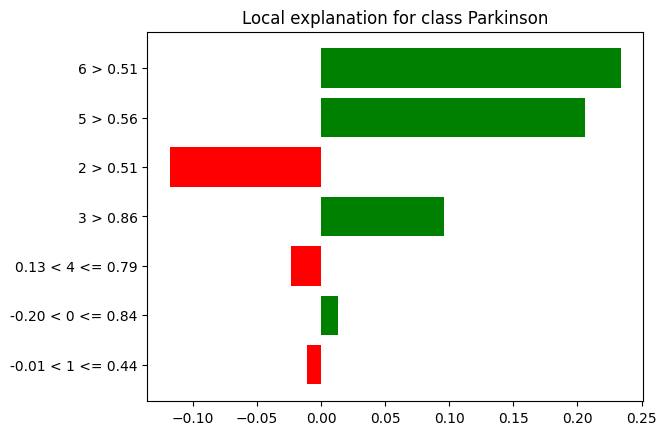

In [176]:
# Plot the explanation
fig = exp.as_pyplot_figure()
plt.show()

In [177]:
import lime
import lime.lime_tabular

In [178]:
# Fit the KNN model
knn.fit(X_train_smote, Y_train_smote)

KNeighborsClassifier()

In [179]:
# Plotting LIME visualization for an instance
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_smote, feature_names=X.columns, class_names=['healthy', 'parkinson'], discretize_continuous=True)
i = 10  # index of the instance to explain
exp = explainer.explain_instance(pd.DataFrame(X_test).iloc[i], knn.predict_proba, num_features=7)

exp.show_in_notebook(show_all=False)

In [180]:
# Plotting LIME visualization for an instance
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_smote, feature_names=X.columns, class_names=['healthy', 'parkinson'], discretize_continuous=True)
i = 10  # index of the instance to explain
exp = explainer.explain_instance(pd.DataFrame(X_test).iloc[i], knn.predict_proba, num_features=5)

exp.show_in_notebook(show_all=False)

In [181]:
#Plotting LIME visualization for an instance
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_smote, feature_names=X.columns, class_names=['healthy', 'parkinson'], discretize_continuous=True)
i = 10  # index of the instance to explain
exp = explainer.explain_instance(pd.DataFrame(X_test).iloc[i], knn.predict_proba, num_features=3)

exp.show_in_notebook(show_all=False)

In [182]:
i = 15  # index of the instance to explain
exp = explainer.explain_instance(pd.DataFrame(X_test).iloc[i], knn.predict_proba, num_features=5)

exp.show_in_notebook(show_all=False)

In [183]:
i = 15  # index of the instance to explain
exp = explainer.explain_instance(pd.DataFrame(X_test).iloc[i], knn.predict_proba, num_features=7)

exp.show_in_notebook(show_all=False)

In [184]:
i = 15  # index of the instance to explain
exp = explainer.explain_instance(pd.DataFrame(X_test).iloc[i], knn.predict_proba, num_features=1)

exp.show_in_notebook(show_all=False)

In [185]:
# Predict the probabilities for each class
y_proba = knn.predict_proba(X_test)

# Print the predicted probabilities
print(y_proba)

[[0.  1. ]
 [1.  0. ]
 [0.  1. ]
 [1.  0. ]
 [0.  1. ]
 [0.4 0.6]
 [0.6 0.4]
 [0.  1. ]
 [0.  1. ]
 [0.2 0.8]
 [0.  1. ]
 [1.  0. ]
 [0.  1. ]
 [0.6 0.4]
 [0.6 0.4]
 [0.4 0.6]
 [0.  1. ]
 [0.8 0.2]
 [0.2 0.8]
 [1.  0. ]
 [0.  1. ]
 [1.  0. ]
 [0.  1. ]
 [0.  1. ]
 [1.  0. ]
 [0.  1. ]
 [0.6 0.4]
 [0.  1. ]
 [0.2 0.8]
 [0.6 0.4]
 [1.  0. ]
 [0.  1. ]
 [0.2 0.8]
 [0.  1. ]
 [0.  1. ]
 [0.4 0.6]
 [0.  1. ]
 [1.  0. ]
 [0.  1. ]]


In [186]:
# Convert y_proba to a DataFrame
df_y_proba = pd.DataFrame(y_proba)

# Set column names
df_y_proba.columns = knn.classes_

# Print the DataFrame
print(df_y_proba)

      0    1
0   0.0  1.0
1   1.0  0.0
2   0.0  1.0
3   1.0  0.0
4   0.0  1.0
5   0.4  0.6
6   0.6  0.4
7   0.0  1.0
8   0.0  1.0
9   0.2  0.8
10  0.0  1.0
11  1.0  0.0
12  0.0  1.0
13  0.6  0.4
14  0.6  0.4
15  0.4  0.6
16  0.0  1.0
17  0.8  0.2
18  0.2  0.8
19  1.0  0.0
20  0.0  1.0
21  1.0  0.0
22  0.0  1.0
23  0.0  1.0
24  1.0  0.0
25  0.0  1.0
26  0.6  0.4
27  0.0  1.0
28  0.2  0.8
29  0.6  0.4
30  1.0  0.0
31  0.0  1.0
32  0.2  0.8
33  0.0  1.0
34  0.0  1.0
35  0.4  0.6
36  0.0  1.0
37  1.0  0.0
38  0.0  1.0


In [187]:
################ Create dataset to compare!
df_y_pred = pd.DataFrame(y_proba, columns=["Probability for Healty in Predictions","Probability for Parkinsons in Predictions"])

In [188]:
df_y_pred

,Probability for Healty in Predictions,Probability for Parkinsons in Predictions
0,0.0,1.0
1,1.0,0.0
2,0.0,1.0
3,1.0,0.0
4,0.0,1.0
5,0.4,0.6
6,0.6,0.4
7,0.0,1.0
8,0.0,1.0
9,0.2,0.8


In [189]:
print(X_test.shape)

(39, 7)


In [190]:
df_y_test = pd.DataFrame(Y_test)
#, columns=["Instance number", "Actual Class"])
df_y_test.rename(columns={"status": "Actual Output"}, inplace=True)
df_y_test
#df_y_test.set_index("Instance number", inplace=True)

,Actual Output
85,1
43,0
80,1
192,0
154,1
182,1
51,0
134,1
19,1
67,1


In [191]:
df_y_test = df_y_test.reset_index()
df_y_test.rename(columns={"index": "Instance Number in actual dataset"}, inplace=True)

print(df_y_test)

    Instance Number in actual dataset  Actual Output
0                                  85              1
1                                  43              0
2                                  80              1
3                                 192              0
4                                 154              1
5                                 182              1
6                                  51              0
7                                 134              1
8                                  19              1
9                                  67              1
10                                120              1
11                                 47              0
12                                121              1
13                                105              1
14                                 38              1
15                                187              0
16                                160              1
17                                129         

In [192]:
merged_df = pd.concat([df_y_test,df_y_pred,], axis=1)

In [193]:
merged_df

,Instance Number in actual dataset,Actual Output,Probability for Healty in Predictions,Probability for Parkinsons in Predictions
0,85,1,0.0,1.0
1,43,0,1.0,0.0
2,80,1,0.0,1.0
3,192,0,1.0,0.0
4,154,1,0.0,1.0
5,182,1,0.4,0.6
6,51,0,0.6,0.4
7,134,1,0.0,1.0
8,19,1,0.0,1.0
9,67,1,0.2,0.8


In [194]:
i = 6  # index of the instance to explain
exp = explainer.explain_instance(pd.DataFrame(X_test).iloc[i], knn.predict_proba, num_features=7)

exp.show_in_notebook(show_all=False)

In [195]:
i = 13  # index of the instance to explain
exp = explainer.explain_instance(pd.DataFrame(X_test).iloc[i], knn.predict_proba, num_features=13)

exp.show_in_notebook(show_all=True)